In [1]:
pip install pandas openpyxl


Note: you may need to restart the kernel to use updated packages.


  Date (YYYY-MM-DD) Time (HH:MM)  Outdoor Temperature (°C)    Corporate  \
0        2021-08-31        08:54                        29  Corporate B   
1        2021-09-01        08:39                        35  Corporate B   
2        2021-09-01        12:18                        24  Corporate C   
3        2021-09-01        07:21                        34  Corporate D   
4        2021-09-02        12:56                        22  Corporate A   

   Building Size (m²)  Humidity (%)  Total Energy Consumption (kWh)  \
0               20000            75                            1828   
1               20000            95                            2050   
2               30000            80                            2189   
3               40000            77                            2861   
4               10000            75                            1345   

   HVAC Energy Consumption (kWh)  Lighting Energy Consumption (kWh)  \
0                            625                   

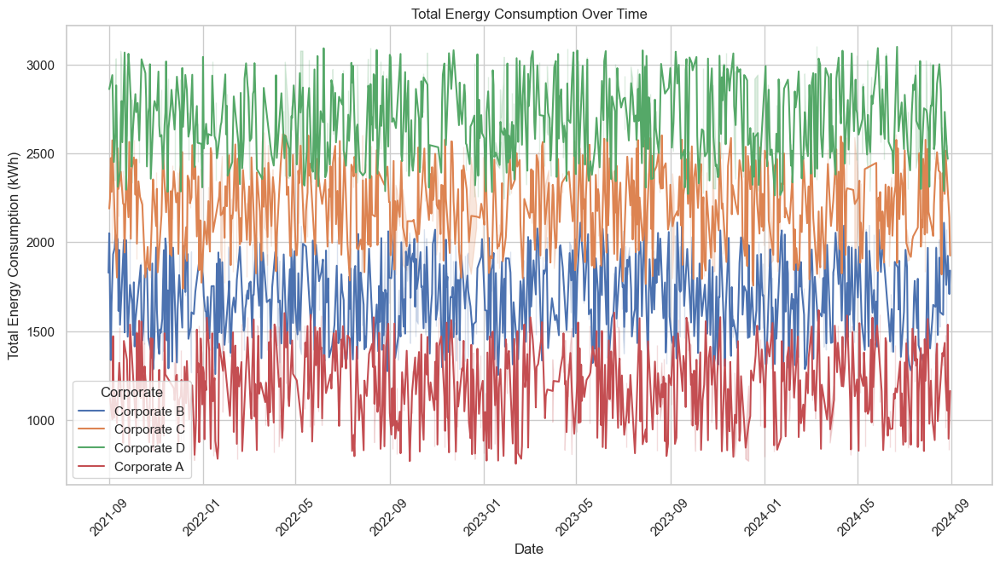

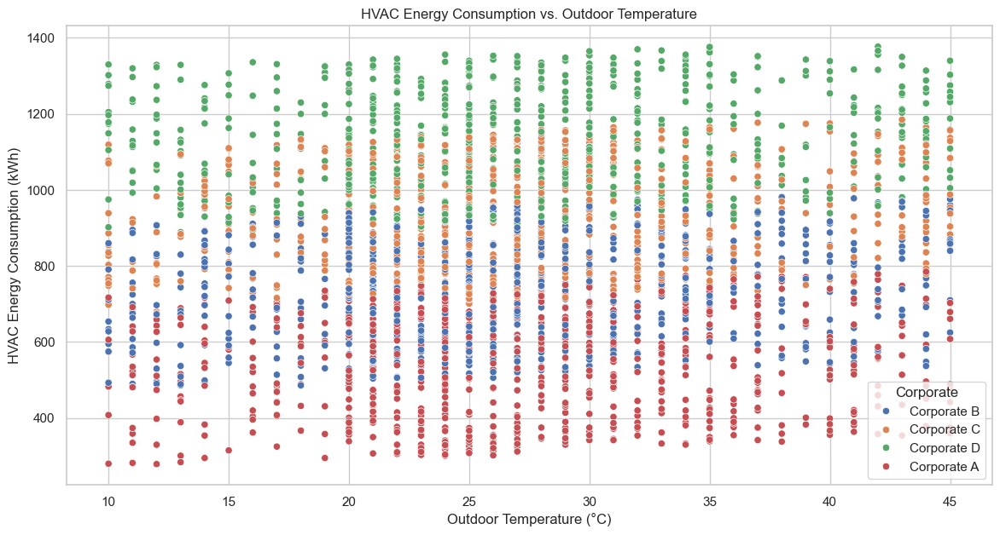

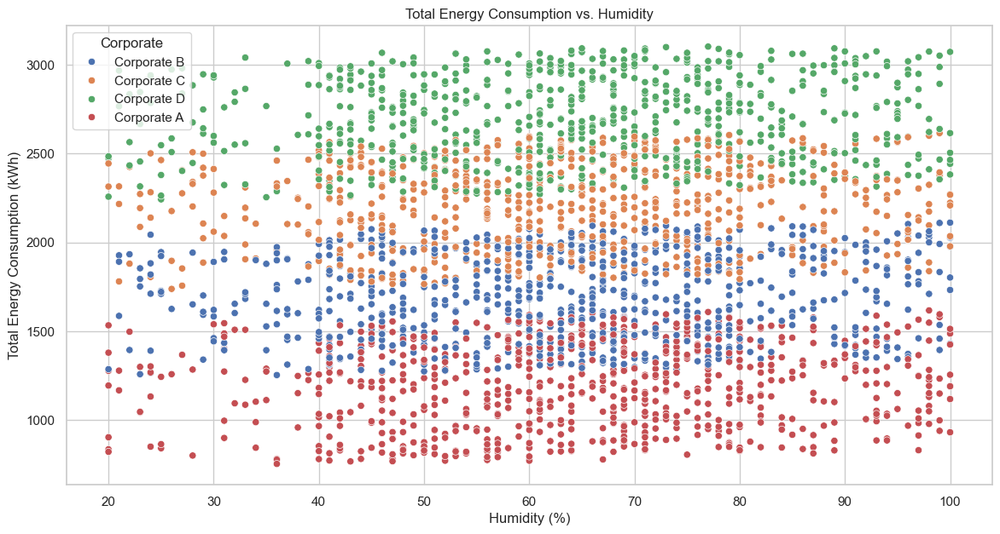

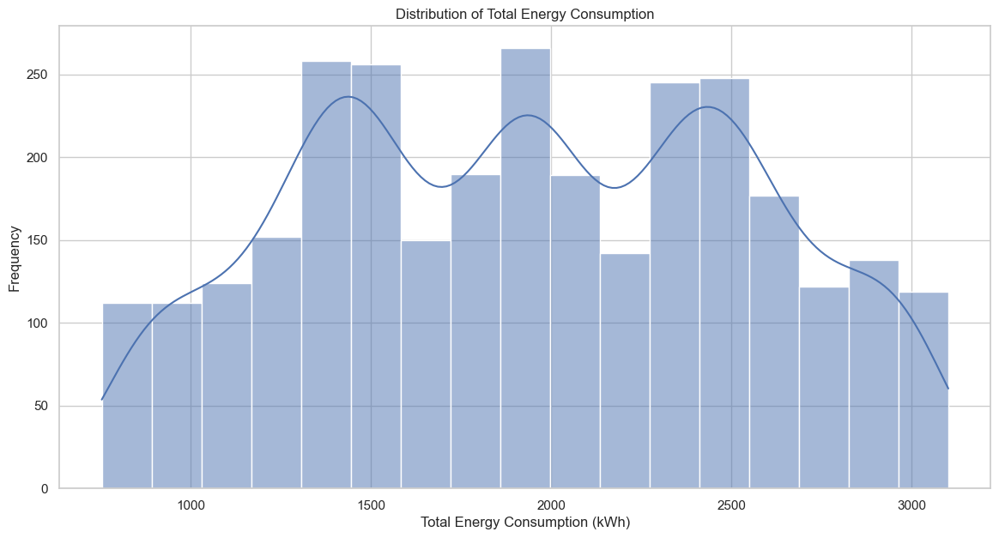

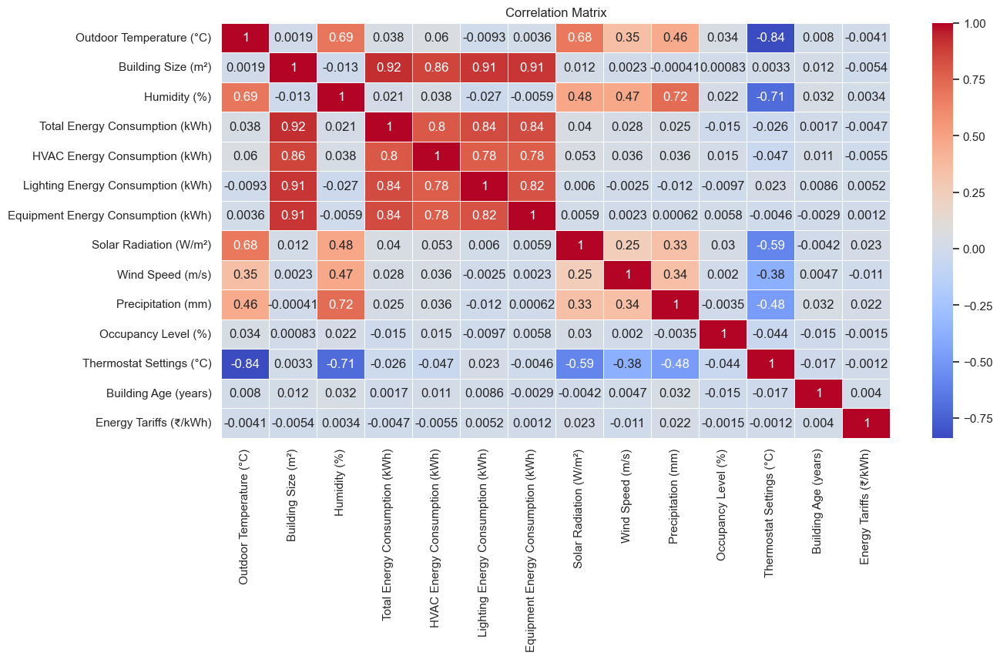

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_excel('D:/Kongsberg/building_energy_data.xlsx')

# Display the first few rows of the DataFrame
print(df.head())

# Set the style for the plots
sns.set(style="whitegrid")

# Plot total energy consumption over time
plt.figure(figsize=(14, 7))
sns.lineplot(x='Date (YYYY-MM-DD)', y='Total Energy Consumption (kWh)', hue='Corporate', data=df)
plt.title('Total Energy Consumption Over Time')
plt.xlabel('Date')
plt.ylabel('Total Energy Consumption (kWh)')
plt.legend(title='Corporate')
plt.xticks(rotation=45)
plt.show()

# Plot HVAC energy consumption vs. outdoor temperature
plt.figure(figsize=(14, 7))
sns.scatterplot(x='Outdoor Temperature (°C)', y='HVAC Energy Consumption (kWh)', hue='Corporate', data=df)
plt.title('HVAC Energy Consumption vs. Outdoor Temperature')
plt.xlabel('Outdoor Temperature (°C)')
plt.ylabel('HVAC Energy Consumption (kWh)')
plt.legend(title='Corporate')
plt.show()

# Plot total energy consumption vs. humidity
plt.figure(figsize=(14, 7))
sns.scatterplot(x='Humidity (%)', y='Total Energy Consumption (kWh)', hue='Corporate', data=df)
plt.title('Total Energy Consumption vs. Humidity')
plt.xlabel('Humidity (%)')
plt.ylabel('Total Energy Consumption (kWh)')
plt.legend(title='Corporate')
plt.show()

# Plot the distribution of total energy consumption
plt.figure(figsize=(14, 7))
sns.histplot(df['Total Energy Consumption (kWh)'], kde=True)
plt.title('Distribution of Total Energy Consumption')
plt.xlabel('Total Energy Consumption (kWh)')
plt.ylabel('Frequency')
plt.show()

# Plot the correlation matrix
plt.figure(figsize=(14, 7))
numeric_df = df.select_dtypes(include=[np.number])  # Select only numeric columns
corr_matrix = numeric_df.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

In [3]:
print(df.info())
print(df.describe())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 24 columns):
 #   Column                              Non-Null Count  Dtype         
---  ------                              --------------  -----         
 0   Date (YYYY-MM-DD)                   3000 non-null   datetime64[ns]
 1   Time (HH:MM)                        3000 non-null   object        
 2   Outdoor Temperature (°C)            3000 non-null   int64         
 3   Corporate                           3000 non-null   object        
 4   Building Size (m²)                  3000 non-null   int64         
 5   Humidity (%)                        3000 non-null   int64         
 6   Total Energy Consumption (kWh)      3000 non-null   int64         
 7   HVAC Energy Consumption (kWh)       3000 non-null   int64         
 8   Lighting Energy Consumption (kWh)   3000 non-null   int64         
 9   Equipment Energy Consumption (kWh)  3000 non-null   int64         
 10  Solar Radiation (W/m²)  

In [4]:
print(df.isnull().sum())


Date (YYYY-MM-DD)                     0
Time (HH:MM)                          0
Outdoor Temperature (°C)              0
Corporate                             0
Building Size (m²)                    0
Humidity (%)                          0
Total Energy Consumption (kWh)        0
HVAC Energy Consumption (kWh)         0
Lighting Energy Consumption (kWh)     0
Equipment Energy Consumption (kWh)    0
Solar Radiation (W/m²)                0
Wind Speed (m/s)                      0
Precipitation (mm)                    0
Occupancy Level (%)                   0
HVAC Mode                             0
Thermostat Settings (°C)              0
Lighting Schedule                     0
Equipment Usage                       0
Insulation Quality                    0
Window Type                           0
Building Age (years)                  0
Energy Tariffs (₹/kWh)                0
Public Holidays                       0
Special Events                        0
dtype: int64


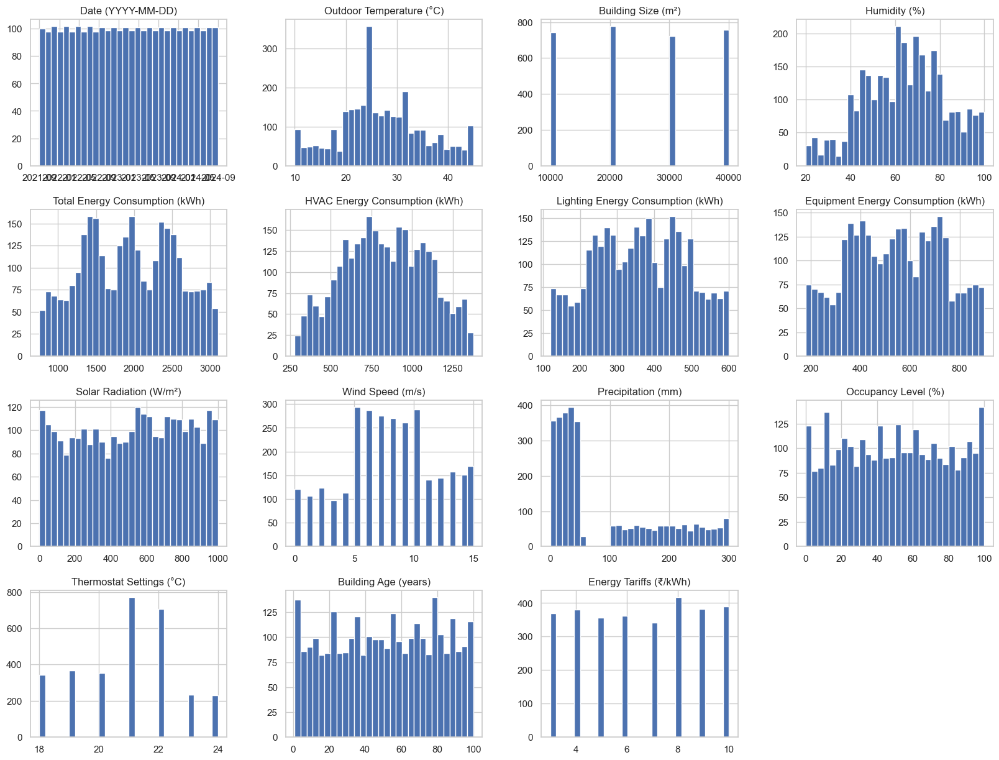

In [5]:
df.hist(bins=30, figsize=(20, 15))
plt.show()


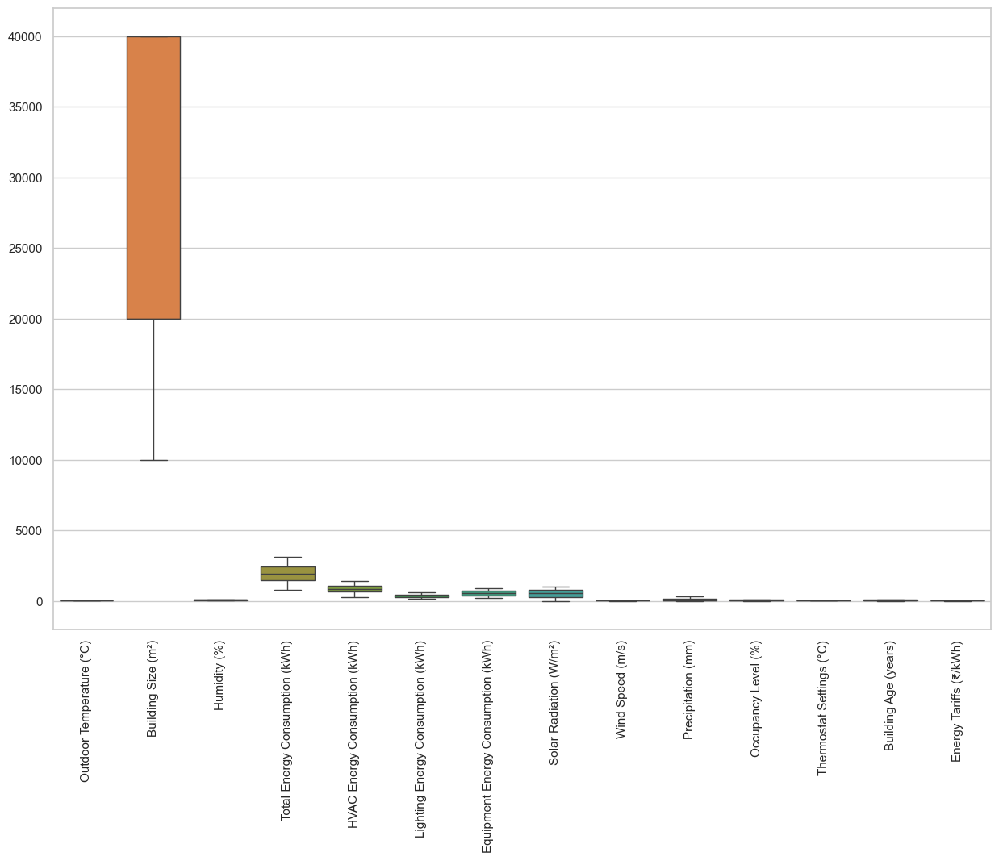

In [6]:
plt.figure(figsize=(15, 10))
sns.boxplot(data=df)
plt.xticks(rotation=90)
plt.show()


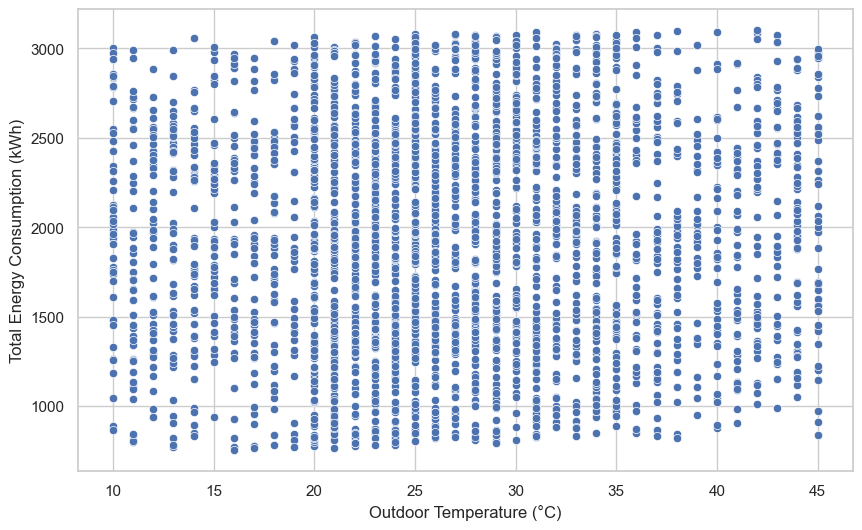

In [7]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Outdoor Temperature (°C)', y='Total Energy Consumption (kWh)', data=df)
plt.show()


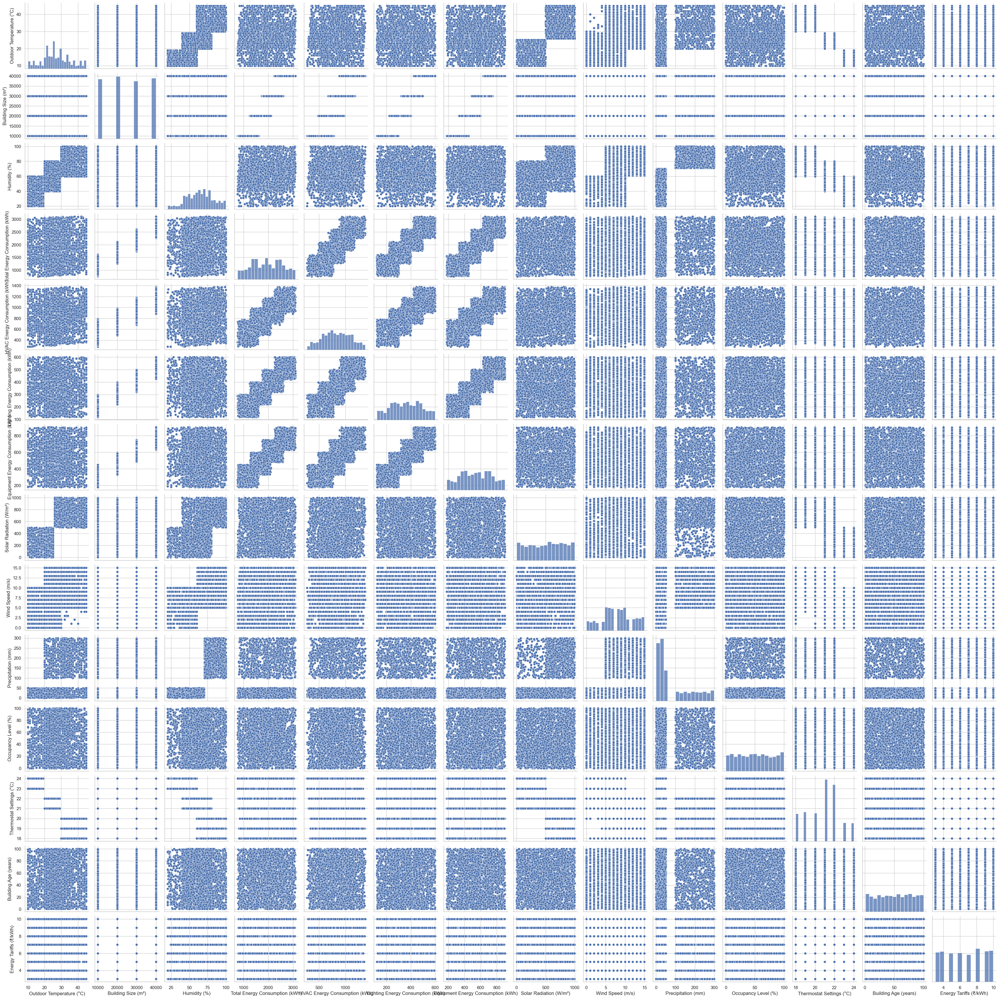

In [8]:
sns.pairplot(df)
plt.show()


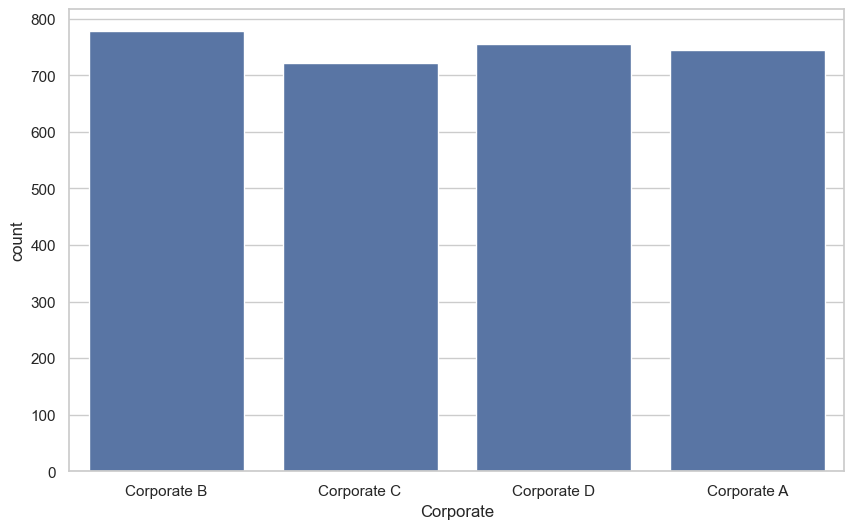

In [9]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Corporate', data=df)
plt.show()


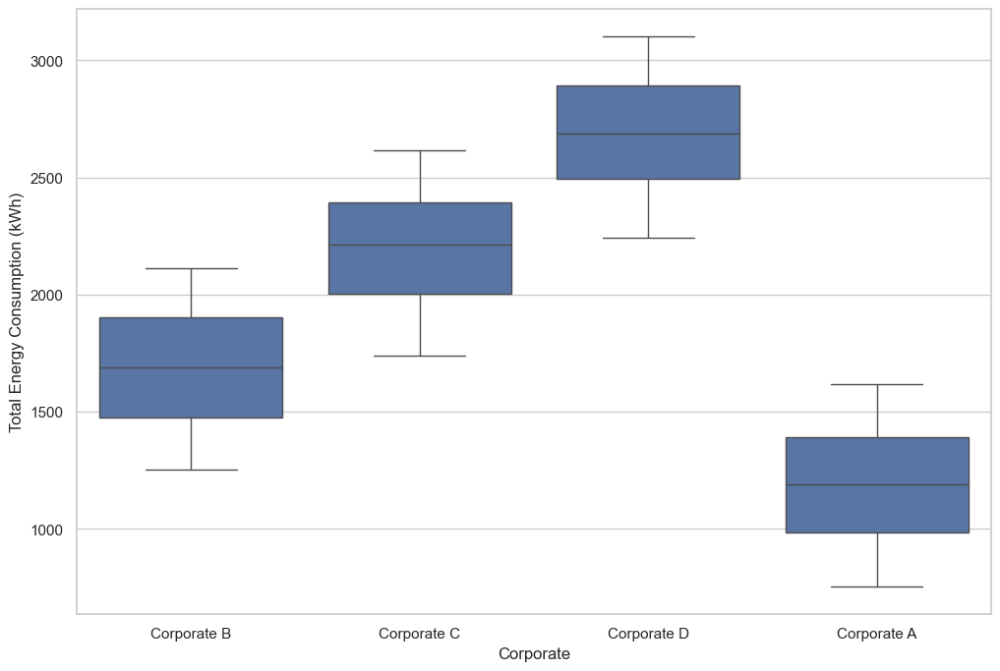

In [10]:
plt.figure(figsize=(12, 8))
sns.boxplot(x='Corporate', y='Total Energy Consumption (kWh)', data=df)
plt.show()


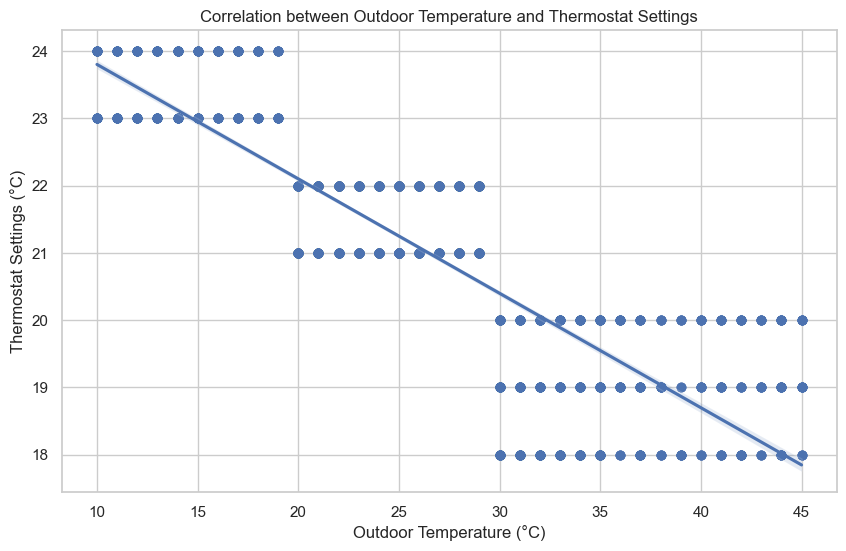

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

# Scatter plot with regression line
plt.figure(figsize=(10, 6))
sns.regplot(x='Outdoor Temperature (°C)', y='Thermostat Settings (°C)', data=df, scatter_kws={'alpha':0.5})
plt.title('Correlation between Outdoor Temperature and Thermostat Settings')
plt.xlabel('Outdoor Temperature (°C)')
plt.ylabel('Thermostat Settings (°C)')
plt.show()


In [12]:
pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [13]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Load the dataset
df = pd.read_excel('D:/Kongsberg/building_energy_data.xlsx')

# Select features and target variable
features = df[['Outdoor Temperature (°C)', 'Humidity (%)', 'Building Size (m²)', 'Solar Radiation (W/m²)', 'Wind Speed (m/s)', 'Precipitation (mm)']]
target = df['Total Energy Consumption (kWh)']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# Train a linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Display the coefficients
coefficients = pd.DataFrame(model.coef_, features.columns, columns=['Coefficient'])
print(coefficients)


Mean Squared Error: 56052.56690711888
                          Coefficient
Outdoor Temperature (°C)     2.067433
Humidity (%)                 0.248010
Building Size (m²)           0.049930
Solar Radiation (W/m²)      -0.008449
Wind Speed (m/s)             2.224559
Precipitation (mm)           0.029596


In [14]:
import pandas as pd
import numpy as np

# Coefficients from your linear regression model
coefficients = {
    'Outdoor Temperature (°C)': 3.854325,
    'Humidity (%)': -0.063801,
    'Building Size (m²)': 0.050401,
    'Solar Radiation (W/m²)': -0.015709,
    'Wind Speed (m/s)': 1.311958,
    'Precipitation (mm)': -0.067989
}

# Intercept (assuming it to be 0 for simplicity)
intercept = 0

# Given values for prediction
outdoor_temp = 32
humidity = 60
building_size = 10000  # Corporate A
solar_radiation = 700
wind_speed = 5
precipitation = 50

# Calculate the total energy consumption
total_energy_consumption = (
    intercept +
    coefficients['Outdoor Temperature (°C)'] * outdoor_temp +
    coefficients['Humidity (%)'] * humidity +
    coefficients['Building Size (m²)'] * building_size +
    coefficients['Solar Radiation (W/m²)'] * solar_radiation +
    coefficients['Wind Speed (m/s)'] * wind_speed +
    coefficients['Precipitation (mm)'] * precipitation
)

print(f"Estimated Total Energy Consumption: {total_energy_consumption:.2f} kWh")


Estimated Total Energy Consumption: 615.68 kWh


In [15]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Load the dataset
df = pd.read_excel('D:/Kongsberg/building_energy_data.xlsx')

# Feature engineering: Adding interaction terms
df['Temp_Humidity_Interaction'] = df['Outdoor Temperature (°C)'] * df['Humidity (%)']

# Select features and target variable
features = df[['Outdoor Temperature (°C)', 'Humidity (%)', 'Building Size (m²)', 'Solar Radiation (W/m²)', 'Wind Speed (m/s)', 'Precipitation (mm)', 'Temp_Humidity_Interaction']]
target = df['Total Energy Consumption (kWh)']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# Train the Random Forest Regressor
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Evaluate the model
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)


# Given values for prediction
outdoor_temp = int(input("Enter out side temp"))
humidity = int(input("Enter humidity"))
building_size = 50000  # Corporate A
solar_radiation = int(input("Enter solar radiation"))
wind_speed = int(input("Enter windspeed"))
precipitation = int(input("Enter precipitation"))
temp_humidity_interaction = outdoor_temp * humidity

# Create a DataFrame for the input
input_data = pd.DataFrame({
    'Outdoor Temperature (°C)': [outdoor_temp],
    'Humidity (%)': [humidity],
    'Building Size (m²)': [building_size],
    'Solar Radiation (W/m²)': [solar_radiation],
    'Wind Speed (m/s)': [wind_speed],
    'Precipitation (mm)': [precipitation],
    'Temp_Humidity_Interaction': [temp_humidity_interaction]
})

# Predict the energy consumption
predicted_energy_consumption = model.predict(input_data)
print(f'Estimated Total Energy Consumption for Corporate: {predicted_energy_consumption[0]:.2f} kWh')


Estimated Total Energy Consumption for Corporate: 2632.13 kWh
